In [1]:
# Install Packages
!pip install geopandas
!pip install geopy
!pip install contextily
!pip install pygeos
!pip install rtree

     |████████████████████████████████| 1.0 MB 5.1 MB/s 
     |████████████████████████████████| 15.4 MB 42.1 MB/s 
     |████████████████████████████████| 6.3 MB 50.3 MB/s 
     |████████████████████████████████| 19.3 MB 1.1 MB/s 
     |████████████████████████████████| 2.1 MB 5.1 MB/s 
     |████████████████████████████████| 994 kB 1.1 MB/s 


In [5]:
# Imports 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from geopy.extra.rate_limiter import RateLimiter
from geopy.geocoders import Nominatim

from shapely.geometry import Point
import contextily as cx
import pygeos

locator = Nominatim(user_agent = "MyGeocoder")
geocode = RateLimiter(lambda x: locator.geocode(query=x), min_delay_seconds=1)

Geocoding - Not necessary once locations are already extracted

In [ ]:
df = pd.read_csv("realtor.csv")[["Address1", "Address2", "price"]]
df.head()

,Address1,Address2,price
0,#1407 -5444 YONGE ST,"Toronto, Ontario M2N6J4",1499999.0
1,#606 -300 BALLIOL ST,"Toronto, Ontario M4S3G6",548800.0
2,#1207 -5 PARKWAY FOREST DR,"Toronto, Ontario M2J1L2",549000.0
3,#404 -55 WELLESLEY ST E,"Toronto, Ontario M4Y2T6",939000.0
4,#1707 -375 KING ST W,"Toronto, Ontario M5V1K1",849000.0


In [ ]:
def address_clean (x):
  x = x[(x.find('-')+1):]
  x = x.lower()

  if x.find('unit#') != -1:
    x = x[:x.find('unit#')]

  return x

df['postal'] = df['Address2'].apply(lambda x: x[-6:])
df['postal'] = df['postal'].apply(lambda x: x[0:3] + " " + x[3:])
df['street'] = df['Address1'].apply(address_clean)

In [ ]:
df.head()

,Address1,Address2,price,postal,street
0,#1407 -5444 YONGE ST,"Toronto, Ontario M2N6J4",1499999.0,M2N 6J4,5444 yonge st
1,#606 -300 BALLIOL ST,"Toronto, Ontario M4S3G6",548800.0,M4S 3G6,300 balliol st
2,#1207 -5 PARKWAY FOREST DR,"Toronto, Ontario M2J1L2",549000.0,M2J 1L2,5 parkway forest dr
3,#404 -55 WELLESLEY ST E,"Toronto, Ontario M4Y2T6",939000.0,M4Y 2T6,55 wellesley st e
4,#1707 -375 KING ST W,"Toronto, Ontario M5V1K1",849000.0,M5V 1K1,375 king st w


In [ ]:
locations = []
lats = []
lons = []
for i, r in df.iterrows():
  query = {
    "street": r['street'],
    "city": "toronto",
    "state": "ontario",
    "country": "canada"
  }
  code = geocode(query)

  if code is None:
    locations.append(None)
    lats.append(None)
    lons.append(None)
  else:
    locations.append(code.raw)
    lats.append(code.raw['lat'])
    lons.append(code.raw['lon'])

In [ ]:
df['lats'] = lats
df['lons'] = lons
df['codes'] = locations

In [ ]:
df.to_csv('locations.csv')

Mapping

In [3]:
df = pd.read_csv('locations.csv')[["Address1", "lats", "lons", "price"]].dropna()
df = df[df.price<3000000]
df = df[df.price>100000]

In [6]:
map = gpd.read_file("/content/drive/MyDrive/Neighbourhoods/Neighbourhoods.shp").to_crs(epsg=3857)

In [7]:
geometry = [Point(xy) for xy in zip(df.lons, df.lats)]

In [9]:
gdf = gpd.GeoDataFrame(df[['price']], crs="EPSG:4326", geometry=geometry).to_crs(epsg=3857)

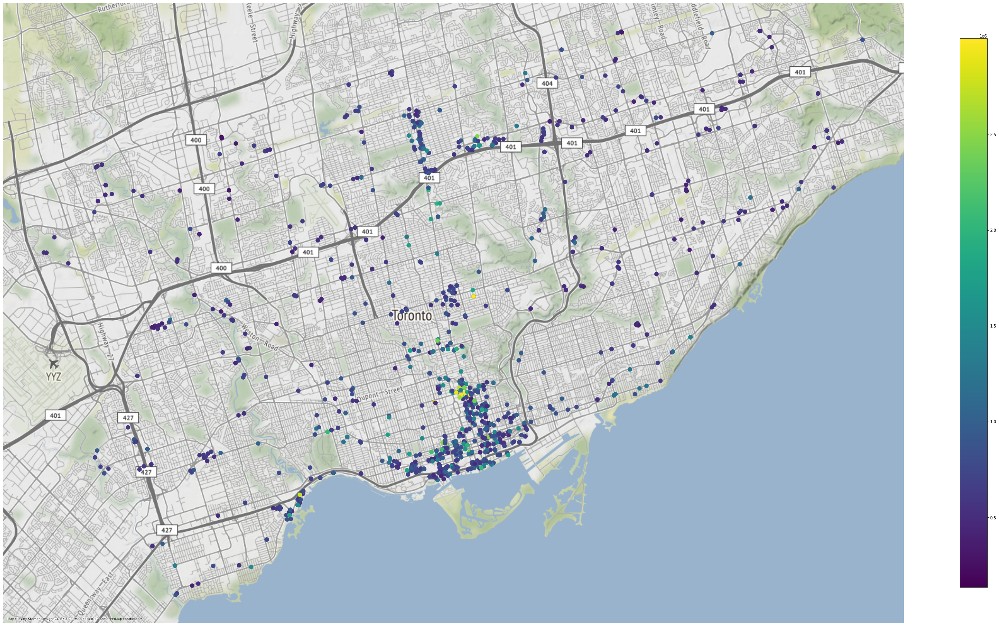

In [10]:
fig, ax = plt.subplots(figsize=(50, 50))

gdf.plot(ax=ax, column="price", alpha=1, markersize=100, legend=True, legend_kwds={'shrink': 0.5})
#plt.xlim((-8.841e+6, -8.834e+6))
#plt.ylim((5.412e+6, 5.417e+6))
cx.add_basemap(ax)
ax.set_axis_off()
#cx.add_basemap(ax, source=cx.providers.Stamen.Watercolor)

In [11]:
merged = gpd.sjoin(map, gdf, how='left').drop('index_right', axis=1)

In [12]:
vals = {}
lens = {}

for i, k in merged.iterrows():
  if not pd.notna(k['price']):
    vals[i] = 0
    lens[i] = 1
  else:
    if i not in vals:
      vals[i] = k['price']
      lens[i] = 1
    else:
      vals[i] += k['price']
      lens[i] += 1

for k in vals:
  vals[k] = vals[k] / lens[k]

In [13]:
avprice = []

for k in vals:
  if vals[k] == 0:
    vals[k] = None
  avprice.append(vals[k])

In [14]:
map['price'] = avprice

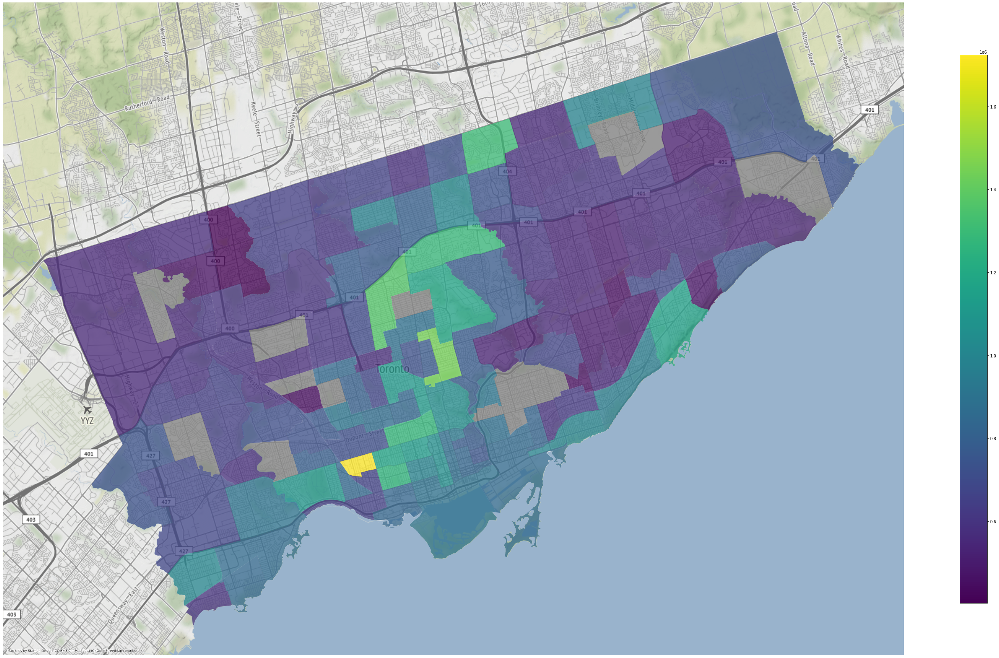

In [15]:
fig, ax = plt.subplots(figsize=(50, 50))

missing_kwds = dict(color='grey')



map.plot(ax=ax, column="price", alpha=0.75, legend=True, legend_kwds={'shrink': 0.5}, missing_kwds=missing_kwds)
#gdf.plot(ax=ax, column="price", alpha=1, markersize=100, cmap='hot', legend=True, legend_kwds={'shrink': 0.5})
#plt.xlim((-8.85e+6, -8.83e+6))
#plt.ylim((5.405e+6, 5.42e+6))
cx.add_basemap(ax)
ax.set_axis_off()